# Simulation Maps

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from lxml import etree

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Data

In [2]:
result = pd.read_csv('tables/sim_results/sim_results.csv')

centroids = pd.read_csv('data/Centroids_USUHI.csv', usecols=['Lat','Lon','Urban_name'])
result    = result.merge(centroids, on='Urban_name')

area_df = pd.read_csv('data/Census_UHI_US_Urbanized_vegetation_albedo_CUHI_SUHI_area.csv')
area_df = area_df[['Urban_name', 'Area_all']].drop_duplicates()
result  = result.merge(area_df, on='Urban_name')

In [3]:
result.head()

Urban_name Climate Zone  Coastal?  Baseline $\Delta$AT Day AWM  \
0      Abilene, TX    Temperate     False                    -0.013062   
1       Albany, OR    Temperate     False                     0.024125   
2  Albuquerque, NM         Arid     False                     0.146844   
3   Alexandria, LA    Temperate     False                    -0.011185   
4    Alton, IL--MO    Temperate     False                     0.041421   

   Baseline $\Delta$AT Day (25th %tile)  \
0                              0.426707   
1                              0.473501   
2                              2.391964   
3                              0.141920   
4                              0.406859   

   Baseline $\Delta$AT Day (25th %tile) Std  \
0                                  0.114001   
1                                  0.284908   
2                                  0.456739   
3                                  0.141223   
4                                  0.101491   

   Baseline $\Delta$AT Day (75th %tile)  \
0                             -0.084702   
1                              0.034839   
2                             -0.607033   
3                             -0.046097   
4                             -0.001700   

   Baseline $\Delta$AT Day (75th %tile) Std  Baseline $\Delta$AT Day Gap  \
0                                  0.192970                    -0.511409   
1                                  0.052425                    -0.438663   
2                                  2.042812                    -2.998997   
3                                  0.081814                    -0.188017   
4                                  0.067445                    -0.408559   

   Baseline $\Delta$AT Night AWM  Baseline $\Delta$AT Night (25th %tile)  \
0                       0.035357                                0.417465   
1                       0.020883                                0.907743   
2                       0.152624                                1.844873   
3                       0.007074                                0.107185   
4                       0.058170                                0.534732   

   Baseline $\Delta$AT Night (25th %tile) Std  \
0                                    0.143012   
1                                    0.062471   
2                                    0.617917   
3                                    0.156283   
4                                    0.184482   

   Baseline $\Delta$AT Night (75th %tile)  \
0                               -0.034359   
1                                0.094063   
2                                0.395542   
3                               -0.004922   
4                               -0.006221   

   Baseline $\Delta$AT Night (75th %tile) Std  Baseline $\Delta$AT Night Gap  \
0                                    0.150640                      -0.451824   
1                                    0.049316                      -0.813679   
2                                    1.051646                      -1.449331   
3                                    0.034744                      -0.112107   
4                                    0.146554                      -0.540953   

   Baseline $\Delta$LST Day AWM  Baseline $\Delta$LST Day (25th %tile)  \
0                     -0.050014                               1.219299   
1                      0.250133                               3.694146   
2                      0.165249                               3.266532   
3                      0.143191                               1.653573   
4                      0.473744                               3.477486   

   Baseline $\Delta$LST Day (25th %tile) Std  \
0                                   0.562781   
1                                   1.629748   
2                                   0.966388   
3                                   1.517227   
4                                   1.307299   

   Baseline $\Delta$LST Day (75th %tile)  \
0                      

## Simulation Maps

In [4]:
def sim_map(sims, data_col, colorbar_title, filename, cmin, cmax):
    # Initialize figure with subplots
    nrows = 2; ncols = 2
    fig = make_subplots(
        rows=nrows, cols=ncols, specs=[
            [{"type": "scattergeo"}, {"type": "scattergeo"}], 
            [{"type": "scattergeo"}, {"type": "scattergeo"}],        
        ], #subplot_titles=('Albedo Management', 'Albedo Management - Low Income', 'Afforestation (50%)', 'Afforestation (100%)',
           #                'Afforestation (50%) - Low Income', 'Afforestation (100%) - Low Income'),
        horizontal_spacing=0.001, vertical_spacing=0.001
    )
    
    temp_result = result.copy()
    

    idx = 0
    for i in range(1,nrows+1):
        for j in range(1,ncols+1):
            temp_data_col = sims[idx] + ' ' + data_col + ' Gap'
            temp_result[temp_data_col] = np.where(temp_result[temp_data_col] < cmin, cmin, temp_result[temp_data_col])
            temp_result[temp_data_col] = np.where(temp_result[temp_data_col] > cmax, cmax, temp_result[temp_data_col])
            fig.add_trace(go.Scattergeo(
            lon = temp_result['Lon'],
            lat = temp_result['Lat'],
            text = data_col + ': ' + temp_result[temp_data_col].round(2).astype(str)+'<br>'+ temp_result['Urban_name'],
            mode = 'markers',
            marker_color = temp_result[temp_data_col],
            marker = dict(
                            size = 6,
                            opacity = 0.8,
                            reversescale = False,
                            symbol = ['triangle-up' if slope < 0 else 'circle' for slope in temp_result[sims[idx] +  ' ' + data_col + ' Slope'].tolist()],
                            line = dict(
                                width=0.5,
                                color= ['black' if pval <= 0.05 else 'purple' for pval in temp_result[sims[idx] +  ' ' + data_col + ' pval'].tolist()] #'lightslategrey'
                            ),
                            colorscale = 'RdYlBu',
                            cmid=0,
                            cmin = cmin,
                            color = temp_result[temp_data_col],
                            cmax = cmax,
                            cauto=True,
                         ),
            name=sims[idx]), 
            row=i, col=j)
        idx+=1

    temp_data_col = sims[-1] + ' ' + data_col + ' Gap'
    temp_result[temp_data_col] = np.where(temp_result[temp_data_col] < cmin, cmin, temp_result[temp_data_col])
    temp_result[temp_data_col] = np.where(temp_result[temp_data_col] > cmax, cmax, temp_result[temp_data_col])
    fig.add_trace(go.Scattergeo(
        lon = temp_result['Lon'],
        lat = temp_result['Lat'],
        text = data_col + ': ' + temp_result[temp_data_col].round(2).astype(str)+'<br>'+ temp_result['Urban_name'],
        mode = 'markers',
        marker_color = temp_result[temp_data_col],
        marker= dict(
                        size = 6,
                        opacity = 0.8,
                        reversescale = False,
                        #autocolorscale = True,
                        symbol = ['triangle-up' if slope < 0 else 'circle' for slope in temp_result[sims[idx] +  ' ' + data_col + ' Slope'].tolist()],
                        line = dict(
                            width=0.5,
                            color=['black' if pval < 0.05 else 'purple' for pval in temp_result[sims[idx] +  ' ' + data_col + ' pval'].tolist()] #'lightslategrey'
                        ),
                        colorscale = 'RdYlBu',
                        cmid=0,
                        cmin = cmin,
                        color = temp_result[temp_data_col],
                        cmax = cmax,
                        cauto=True,
                        colorbar=dict(
                            orientation='h',
                            title=dict(
                                text=colorbar_title, side='top'
                            ),
                            x=0.5, y=1, len=0.7
                            #x=0.5, y=1.05, len=0.7           
                        )
                     ),
        name=sims[-1]), 
        row=nrows, col=ncols)              

    fig.update_layout(
        geo1=dict(scope='usa'), geo2=dict(scope='usa'), geo3=dict(scope='usa'),
        geo4=dict(scope='usa'), geo5=dict(scope='usa'), geo6=dict(scope='usa'),
        showlegend=False, height=525, width=850, margin={'t':40,'l':0,'b':0,'r':70},
    )
    pio.write_image(fig, 'graphs/simulations/maps/{}.svg'.format(filename), scale=1)
    fig.show()

### $\Delta$AT Day

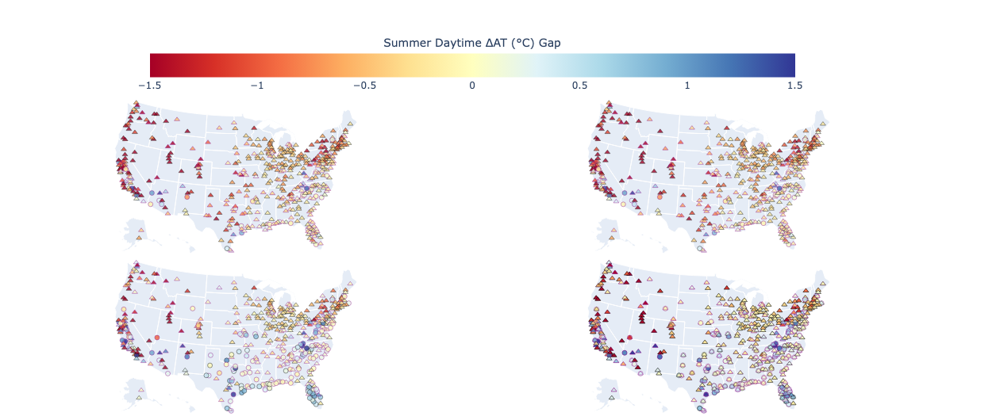

In [5]:
sim_map(sims=['100% Afforestation', 'Targeted 100% Afforestation', 
                  'Albedo Management/100% Afforestation', 'Targeted Albedo Management/100% Afforestation'], 
            data_col='$\\Delta$AT Day', 
            colorbar_title='Summer Daytime \u0394AT (\u00b0C) Gap', 
            filename='at_day_upper_bound', cmin=-1.5, cmax=1.5)

### $\Delta$AT Night

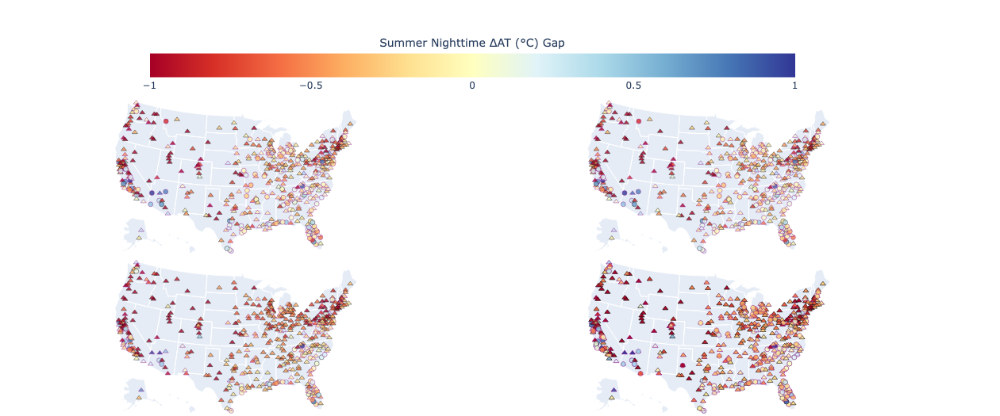

In [6]:
sim_map(sims=['100% Afforestation', 'Targeted 100% Afforestation', 
                  'Albedo Management/100% Afforestation', 'Targeted Albedo Management/100% Afforestation'], 
            data_col='$\\Delta$AT Night', 
            colorbar_title='Summer Nighttime \u0394AT (\u00b0C) Gap', 
            filename='at_night_upper_bound', cmin=-1, cmax=1)

### $\Delta$LST Day

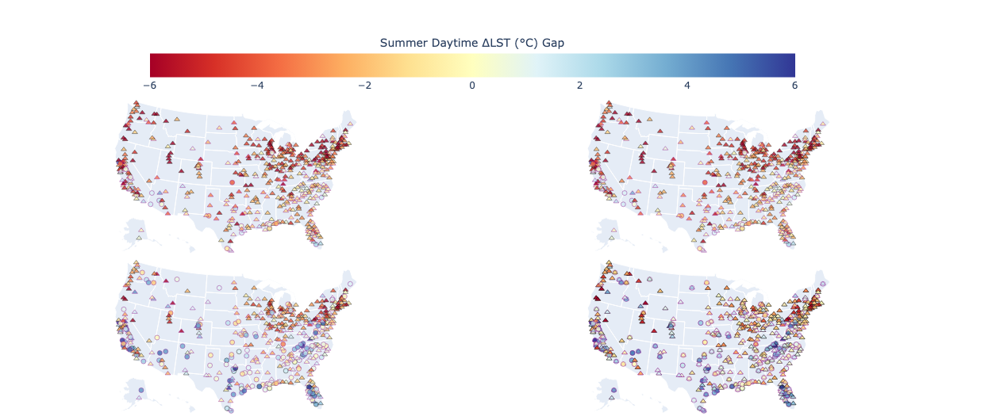

In [7]:
sim_map(sims=['100% Afforestation', 'Targeted 100% Afforestation', 
                  'Albedo Management/100% Afforestation', 'Targeted Albedo Management/100% Afforestation'], 
            data_col='$\\Delta$LST Day', 
            colorbar_title='Summer Daytime \u0394LST (\u00b0C) Gap', 
            filename='lst_day_upper_bound', cmin=-6, cmax=6)

### $\Delta$LST Night

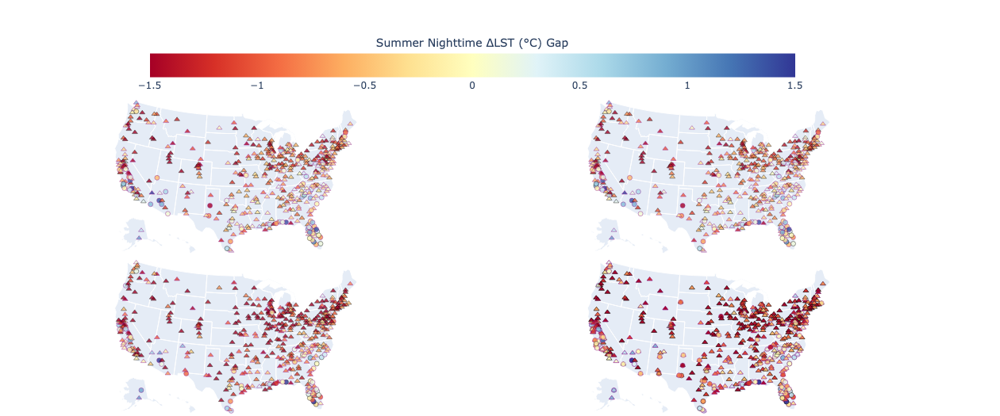

In [8]:
sim_map(sims=['100% Afforestation', 'Targeted 100% Afforestation', 
                  'Albedo Management/100% Afforestation', 'Targeted Albedo Management/100% Afforestation'], 
            data_col='$\\Delta$LST Night', 
            colorbar_title='Summer Nighttime \u0394LST (\u00b0C) Gap', 
            filename='lst_night_upper_bound', cmin=-1.5, cmax=1.5)

## Supplementary Simulation Maps

In [9]:
def sim_map_supp(sims, data_col, colorbar_title, filename, cmin, cmax):
    # Initialize figure with subplots
    nrows = 3; ncols = 2
    fig = make_subplots(
        rows=nrows, cols=ncols, specs=[
            [{"type": "scattergeo"}, {"type": "scattergeo"}], 
            [{"type": "scattergeo"}, {"type": "scattergeo"}],
            [{"type": "scattergeo"}, {"type": "scattergeo"}],        
        ], 
        horizontal_spacing=0.001, vertical_spacing=0.001
    )
    
    temp_result = result.copy()
    

    idx = 0
    for i in range(1,nrows+1):
        for j in range(1,ncols+1):
            temp_data_col = sims[idx] + ' ' + data_col + ' Gap'
            temp_result[temp_data_col] = np.where(temp_result[temp_data_col] < cmin, cmin, temp_result[temp_data_col])
            temp_result[temp_data_col] = np.where(temp_result[temp_data_col] > cmax, cmax, temp_result[temp_data_col])
            fig.add_trace(go.Scattergeo(
            lon = temp_result['Lon'],
            lat = temp_result['Lat'],
            text = data_col + ': ' + temp_result[temp_data_col].round(2).astype(str)+'<br>'+ temp_result['Urban_name'],
            mode = 'markers',
            marker_color = temp_result[temp_data_col],
            marker = dict(
                            size = 6,
                            opacity = 0.8,
                            reversescale = False,
                            symbol = ['triangle-up' if slope < 0 else 'circle' for slope in temp_result[sims[idx] +  ' ' + data_col + ' Slope'].tolist()],
                            line = dict(
                                width=0.5,
                                color= ['black' if pval <= 0.05 else 'purple' for pval in temp_result[sims[idx] +  ' ' + data_col + ' pval'].tolist()] #'lightslategrey'
                            ),
                            colorscale = 'RdYlBu',
                            cmid=0,
                            cmin = cmin,
                            color = temp_result[temp_data_col],
                            cmax = cmax,
                            cauto=True,
                         ),
            name=sims[idx]), 
            row=i, col=j)
        idx+=1

    temp_data_col = sims[-1] + ' ' + data_col + ' Gap'
    temp_result[temp_data_col] = np.where(temp_result[temp_data_col] < cmin, cmin, temp_result[temp_data_col])
    temp_result[temp_data_col] = np.where(temp_result[temp_data_col] > cmax, cmax, temp_result[temp_data_col])
    fig.add_trace(go.Scattergeo(
        lon = temp_result['Lon'],
        lat = temp_result['Lat'],
        text = data_col + ': ' + temp_result[temp_data_col].round(2).astype(str)+'<br>'+ temp_result['Urban_name'],
        mode = 'markers',
        marker_color = temp_result[temp_data_col],
        marker= dict(
                        size = 6,
                        opacity = 0.8,
                        reversescale = False,
                        #autocolorscale = True,
                        symbol = ['triangle-up' if slope < 0 else 'circle' for slope in temp_result[sims[idx] +  ' ' + data_col + ' Slope'].tolist()],
                        line = dict(
                            width=0.5,
                            color=['black' if pval < 0.05 else 'purple' for pval in temp_result[sims[idx] +  ' ' + data_col + ' pval'].tolist()] #'lightslategrey'
                        ),
                        colorscale = 'RdYlBu',
                        cmid=0,
                        cmin = cmin,
                        color = temp_result[temp_data_col],
                        cmax = cmax,
                        cauto=True,
                        colorbar=dict(
                            orientation='h',
                            title=dict(
                                text=colorbar_title, side='top'
                            ),
                            x=0.5, y=1, len=0.7
                            #x=0.5, y=1.05, len=0.7           
                        )
                     ),
        name=sims[-1]), 
        row=nrows, col=ncols)              

    fig.update_layout(
        geo1=dict(scope='usa'), geo2=dict(scope='usa'), geo3=dict(scope='usa'),
        geo4=dict(scope='usa'), geo5=dict(scope='usa'), geo6=dict(scope='usa'),
        showlegend=False, height=750, width=850, margin={'t':40,'l':0,'b':0,'r':70},
    )
    pio.write_image(fig, 'graphs/simulations/maps/{}.svg'.format(filename), scale=1)
    fig.show()

### $\Delta$AT Day - Combination Simulations

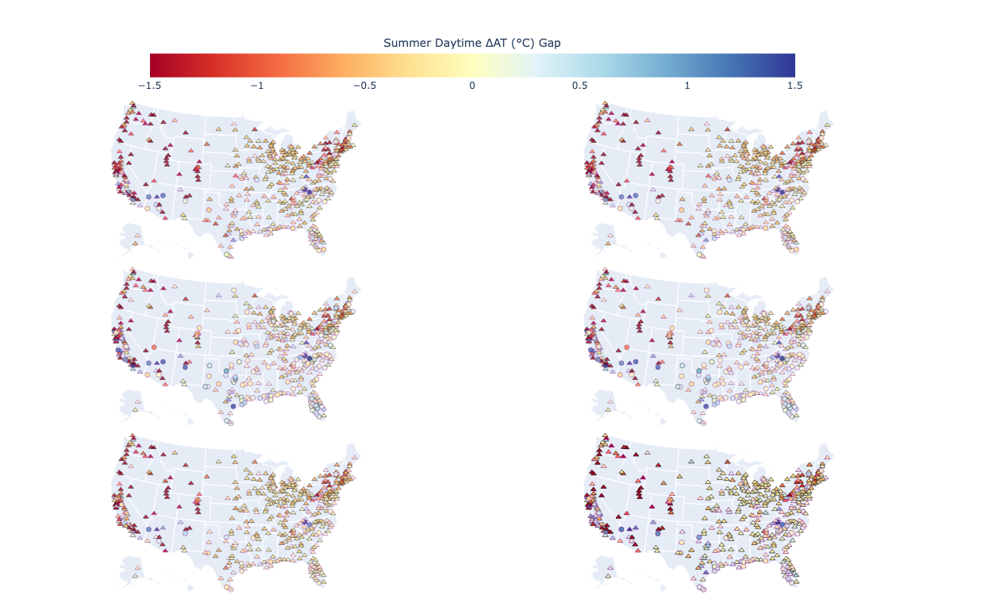

In [10]:
sim_map_supp(sims=['50% Afforestation', 'Targeted 50% Afforestation',
                       'Albedo Management', 'Targeted Albedo Management', 
                       'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
                 data_col='$\\Delta$AT Day', 
                 colorbar_title='Summer Daytime \u0394AT (\u00b0C) Gap', 
                 filename='at_day_supp', cmin=-1.5, cmax=1.5)

### $\Delta$AT Night - Combination Simulations

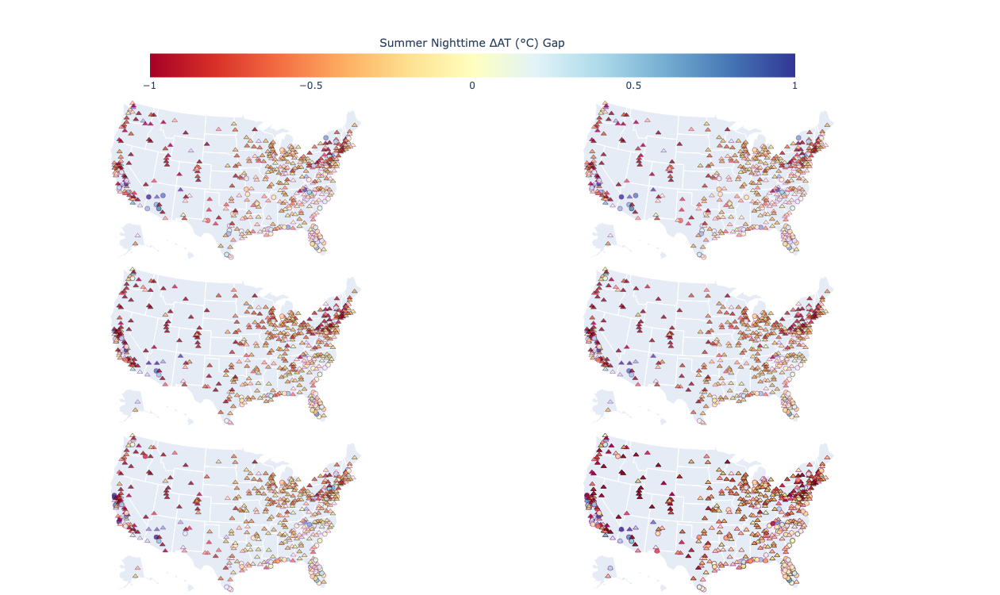

In [11]:
sim_map_supp(sims=['50% Afforestation', 'Targeted 50% Afforestation',
                       'Albedo Management', 'Targeted Albedo Management', 
                       'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
                 data_col='$\\Delta$AT Night', 
                 colorbar_title='Summer Nighttime \u0394AT (\u00b0C) Gap', 
                 filename='at_night_supp', cmin=-1, cmax=1)

### $\Delta$LST Day - Combination Simulations

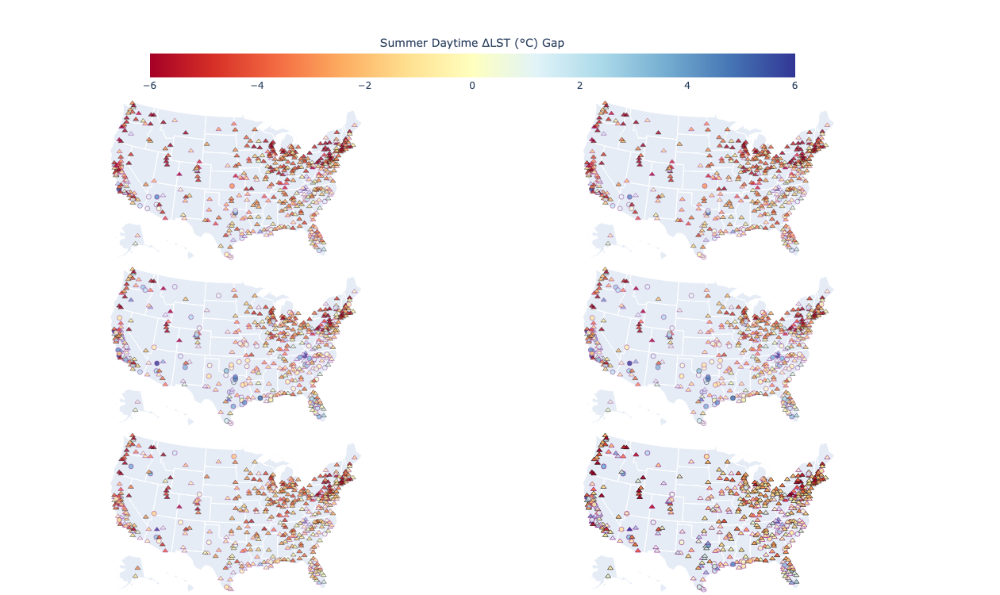

In [12]:
sim_map_supp(sims=['50% Afforestation', 'Targeted 50% Afforestation',
                       'Albedo Management', 'Targeted Albedo Management', 
                       'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
                 data_col='$\\Delta$LST Day', 
                 colorbar_title='Summer Daytime \u0394LST (\u00b0C) Gap', 
                 filename='lst_day_supp', cmin=-6, cmax=6)

### $\Delta$LST Night - Combination Simulations

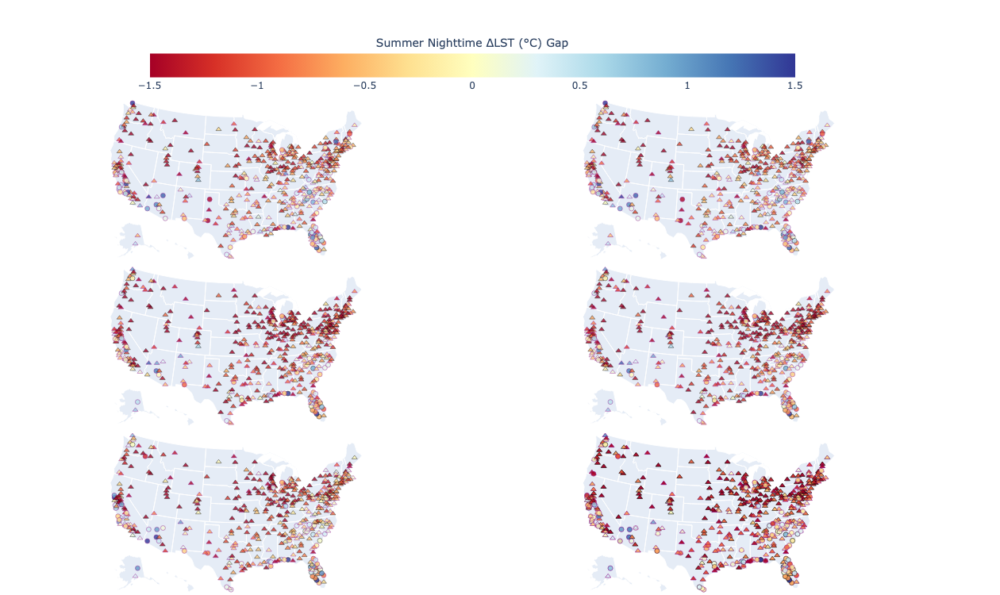

In [13]:
sim_map_supp(sims=['50% Afforestation', 'Targeted 50% Afforestation',
                       'Albedo Management', 'Targeted Albedo Management', 
                       'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
                 data_col='$\\Delta$LST Night', 
                 colorbar_title='Summer Nighttime \u0394LST (\u00b0C) Gap', 
                 filename='lst_night_supp', cmin=-1.5, cmax=1.5)

## Add annotations

### Upper Bound Maps

In [14]:
def annotate_ub(label, sims, svg_path, save_path):
    x_list = ['325', '715']
    y_list = [['225', '240', '255', '280', '295'], ['430', '445', '460', '485', '500']]
    text_list = ['Std: {:.3f}', 'Mean: {:.3f}', 'Median: {:.3f}', '{} cities have', 'negative slopes']
    
    tree = etree.parse(svg_path)
    root = tree.getroot()
    
    text_element = etree.Element('text', x='60', y='20', fill='black', style='font-size: 14px; font-family: Verdana;')
    text_element.text = 'Worse for low income group'
    root.append(text_element)
    
    text_element = etree.Element('text', x='60', y='40', fill='black', style='font-size: 14px; font-family: Verdana;')
    text_element.text = 'Worse for high income group'
    root.append(text_element)
    
    circle = etree.SubElement(root, "circle", cx="48", cy="36", r="5.5")
    root.append(circle)
    
    #triangle = etree.Element("polygon", points="250,10 256,20 244,20")
    triangle = etree.Element("polygon", points="48,10 54,20 42,20")
    root.append(triangle)
    
    idx=0
    for x in x_list:
        for y in y_list:
            col = sims[idx] + ' ' + label + ' Gap'
            # Add gap standard deviation annotation
            text_element = etree.Element('text', x=x, y=y[0], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[0].format( result[col].std() )
            root.append(text_element)
            
            # Add mean gap annotation
            text_element = etree.Element('text', x=x, y=y[1], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[1].format( result[col].mean() )
            root.append(text_element)
            
            # Add median gap annotation
            text_element = etree.Element('text', x=x, y=y[2], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[2].format( result[col].median() )
            root.append(text_element)
            
            # Add slope annotation
            text_element = etree.Element('text', x=x, y=y[3], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[3].format(len(result[result[col] < 0]))
            root.append(text_element)
            
            text_element = etree.Element('text', x=x, y=y[4], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[4]
            root.append(text_element)
            
            idx+=1

    refs = ['A', 'C', 'B', 'D']
    ref_x_loc = ['40', '430']
    ref_y_loc = ['140', '340']
    idx = 0
    for x in ref_x_loc:
        for y in ref_y_loc:
            text_element = etree.Element('text', x=x, y=y, fill='black', style='font-size: 20px; font-family: Verdana;')
            text_element.text = refs[idx]
            root.append(text_element)
            idx+=1
           
    # Save the modified SVG file
    tree.write(save_path, pretty_print=True, xml_declaration=True, encoding='utf-8')

In [15]:
upper_bound_sims = ['100% Afforestation', 'Targeted 100% Afforestation', 
                    'Albedo Management/100% Afforestation', 'Targeted Albedo Management/100% Afforestation']

In [16]:
annotate_ub(label='$\\Delta$AT Day', 
            sims=upper_bound_sims, 
            svg_path ='graphs/simulations/maps/at_day_upper_bound.svg', 
            save_path='graphs/simulations/maps/details/at_day_upper_bound_details.svg')

In [17]:
annotate_ub(label='$\\Delta$AT Night', 
            sims=upper_bound_sims, 
            svg_path ='graphs/simulations/maps/at_night_upper_bound.svg', 
            save_path='graphs/simulations/maps/details/at_night_upper_bound_details.svg')

In [18]:
annotate_ub(label='$\\Delta$LST Day', 
            sims=upper_bound_sims, 
            svg_path ='graphs/simulations/maps/lst_day_upper_bound.svg', 
            save_path='graphs/simulations/maps/details/lst_day_upper_bound_details.svg')

In [19]:
annotate_ub(label='$\\Delta$LST Night', 
            sims=upper_bound_sims, 
            svg_path ='graphs/simulations/maps/lst_night_upper_bound.svg', 
            save_path='graphs/simulations/maps/details/lst_night_upper_bound_details.svg')

### Other Maps 

In [20]:
def annotate_supp(label, sims, svg_path, save_path):
    x_list = ['325', '715']
    y_list = [['225', '240', '255', '280', '295'], ['430', '445', '460', '485', '500'], ['635', '650', '665', '690', '705']]
    text_list = ['Std: {:.3f}', 'Mean: {:.3f}', 'Median: {:.3f}', '{} cities have', 'negative slopes']
    
    tree = etree.parse(svg_path)
    root = tree.getroot()
    
    text_element = etree.Element('text', x='60', y='20', fill='black', style='font-size: 14px; font-family: Verdana;')
    text_element.text = 'Worse for low income group'
    root.append(text_element)
    
    text_element = etree.Element('text', x='60', y='40', fill='black', style='font-size: 14px; font-family: Verdana;')
    text_element.text = 'Worse for high income group'
    root.append(text_element)
    
    circle = etree.SubElement(root, "circle", cx="48", cy="36", r="5.5")
    root.append(circle)
    
    #triangle = etree.Element("polygon", points="250,10 256,20 244,20")
    triangle = etree.Element("polygon", points="48,10 54,20 42,20")
    root.append(triangle)
    
    idx=0
    for x in x_list:
        for y in y_list:
            col = sims[idx] + ' ' + label + ' Gap'
            # Add gap standard deviation annotation
            text_element = etree.Element('text', x=x, y=y[0], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[0].format( result[col].std() )
            root.append(text_element)
            
            # Add mean gap annotation
            text_element = etree.Element('text', x=x, y=y[1], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[1].format( result[col].mean() )
            root.append(text_element)
            
            # Add median gap annotation
            text_element = etree.Element('text', x=x, y=y[2], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[2].format( result[col].median() )
            root.append(text_element)
            
            # Add slope annotation
            text_element = etree.Element('text', x=x, y=y[3], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[3].format(len(result[result[col] < 0]))
            root.append(text_element)
            
            text_element = etree.Element('text', x=x, y=y[4], fill='black', style='font-size: 12px; font-family: Verdana;')
            text_element.text = text_list[4]
            root.append(text_element)
            
            idx+=1

    refs = ['A', 'C', 'E', 'B', 'D', 'F']
    ref_x_loc = ['40', '430']
    ref_y_loc = ['140', '350', '560']
    idx = 0
    for x in ref_x_loc:
        for y in ref_y_loc:
            text_element = etree.Element('text', x=x, y=y, fill='black', style='font-size: 20px; font-family: Verdana;')
            text_element.text = refs[idx]
            root.append(text_element)
            idx+=1
           
    # Save the modified SVG file
    tree.write(save_path, pretty_print=True, xml_declaration=True, encoding='utf-8')

In [21]:
annotate_supp(label='$\\Delta$AT Day', 
              sims=['50% Afforestation', 'Targeted 50% Afforestation',
                    'Albedo Management', 'Targeted Albedo Management', 
                    'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
              svg_path ='graphs/simulations/maps/at_day_supp.svg', 
              save_path='graphs/simulations/maps/details/at_day_supp_details.svg')

In [22]:
annotate_supp(label='$\\Delta$AT Night', 
              sims=['50% Afforestation', 'Targeted 50% Afforestation',
                    'Albedo Management', 'Targeted Albedo Management', 
                    'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
              svg_path ='graphs/simulations/maps/at_night_supp.svg', 
              save_path='graphs/simulations/maps/details/at_night_supp_details.svg')

In [23]:
annotate_supp(label='$\\Delta$LST Day', 
              sims=['50% Afforestation', 'Targeted 50% Afforestation',
                    'Albedo Management', 'Targeted Albedo Management', 
                    'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
              svg_path ='graphs/simulations/maps/lst_day_supp.svg', 
              save_path='graphs/simulations/maps/details/lst_day_supp_details.svg')

In [24]:
annotate_supp(label='$\\Delta$LST Night', 
              sims=['50% Afforestation', 'Targeted 50% Afforestation',
                    'Albedo Management', 'Targeted Albedo Management', 
                    'Albedo Management/50% Afforestation', 'Targeted Albedo Management/50% Afforestation'], 
              svg_path ='graphs/simulations/maps/lst_night_supp.svg', 
              save_path='graphs/simulations/maps/details/lst_night_supp_details.svg')